In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import imageio.v3 as imageio
import albumentations as A

from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
from torch import nn
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from torchvision import transforms

import torch
import timm
import glob
import torchmetrics
import time
import psutil
import os
import math
import warnings

tqdm.pandas()

In [3]:
mps_device = torch.device("mps")
has_mps = torch.backends.mps.is_available()

In [4]:
class Config():
    IMAGE_SIZE0 = 512
    IMAGE_SIZE = 288
    TARGET_COLUMNS = ['X4_mean', 'X11_mean', 'X18_mean', 'X50_mean', 'X26_mean', 'X3112_mean']
    TARGET_COLUMNS_TEST = ['X4', 'X11', 'X18', 'X50', 'X26', 'X3112']
    N_TARGETS = len(TARGET_COLUMNS)

    RECOMPUTE_DATAFRAMES = True
    BATCH_SIZE = 24
    BATCH_SIZE_VAL = 128
    N_VAL_SAMPLES0 = 4096

    LR_MAX = 3e-4
    WEIGHT_DECAY = 0.01
    N_EPOCHS = 12
    TRAIN_MODEL = True

    SEED = 42
    EPS = 1e-6
    if has_mps:
        EPS_MPS = torch.tensor([EPS]).to(mps_device)
        print("mps enabled")


CONFIG = Config()

mps enabled


In [9]:
!jupyter nbextension enable --py widgetsnbextension


Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [5]:
if CONFIG.RECOMPUTE_DATAFRAMES:
    train0 = pd.read_csv('data/planttraits2024_1/train.csv')

    train0['file_path'] = train0['id'].apply(lambda s:f"data/planttraits2024_1/train_images/{s}.jpeg")
    train0['jpeg_bytes'] = train0['file_path'].progress_apply(lambda fp: open(fp, 'rb').read())

    train0.to_pickle('train.pkl')

else:
    train0 = pd.read_pickle('train.pkl')

CONFIG.TARGET_MEDIANS = train0[CONFIG.TARGET_COLUMNS].median(axis=0).values


100%|██████████| 55489/55489 [00:11<00:00, 4709.69it/s]


In [6]:
train, val = train_test_split(train0, test_size=CONFIG.N_VAL_SAMPLES0, shuffle=True, random_state=CONFIG.SEED)
train = train.reset_index(drop=True)
val = val.reset_index(drop=True)

display(train.head())
display(train.info())

,id,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,...,X50_mean,X3112_mean,X4_sd,X11_sd,X18_sd,X26_sd,X50_sd,X3112_sd,file_path,jpeg_bytes
0,196624290,16.648258,404.545929,87.642860,101.176125,424.887177,26.180101,139,166,156,...,1.851404,2245.603152,0.002085,0.187827,0.064559,0.065326,0.030949,88.683653,data/planttraits2024_1/train_images/196624290....,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...
1,196189742,13.411370,1136.826660,234.182220,94.147125,332.503937,18.968889,116,144,130,...,1.711225,489.488277,0.003707,0.424258,0.017467,0.192608,0.018882,23.418026,data/planttraits2024_1/train_images/196189742....,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...
2,194460461,9.295298,645.719055,31.271429,20.844044,751.378235,28.223808,123,146,131,...,0.934460,476.389699,0.005200,0.792265,0.139783,0.011707,0.019554,45.876232,data/planttraits2024_1/train_images/194460461....,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...
3,93537648,26.872620,847.530640,198.357147,100.623215,59.281303,12.264285,134,146,141,...,1.583896,2741.958201,NaN,NaN,NaN,NaN,NaN,NaN,data/planttraits2024_1/train_images/93537648.jpeg,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...
4,160706420,22.923363,776.178589,193.000000,107.569908,268.802460,20.789286,136,145,141,...,0.987728,425.886697,0.002632,0.157741,0.019281,0.003622,0.004140,21.761224,data/planttraits2024_1/train_images/160706420....,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51393 entries, 0 to 51392
Columns: 178 entries, id to jpeg_bytes
dtypes: float64(54), int64(122), object(2)
memory usage: 69.8+ MB


None

In [7]:
if CONFIG.RECOMPUTE_DATAFRAMES:
    test = pd.read_csv('data/planttraits2024_1/test.csv')
    test['file_path'] = test['id'].apply(lambda s: f'data/planttraits2024_1/test_images/{s}.jpeg')
    test['jpeg_bytes'] = test['file_path'].progress_apply(lambda fp: open(fp, 'rb').read())

    test.to_pickle('test.pkl')
else:
    test = pd.read_pickle('test.pkl')

display(test.head())
display(test.info())

100%|██████████| 6545/6545 [00:01<00:00, 4692.16it/s]


,id,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,...,VOD_X_1997_2018_multiyear_mean_m05,VOD_X_1997_2018_multiyear_mean_m06,VOD_X_1997_2018_multiyear_mean_m07,VOD_X_1997_2018_multiyear_mean_m08,VOD_X_1997_2018_multiyear_mean_m09,VOD_X_1997_2018_multiyear_mean_m10,VOD_X_1997_2018_multiyear_mean_m11,VOD_X_1997_2018_multiyear_mean_m12,file_path,jpeg_bytes
0,201238668,8.086756,2246.500000,127.321426,20.423418,353.381042,17.535713,80,109,90,...,0.387536,0.374910,0.363712,0.364623,0.379435,0.388294,0.398887,0.397853,data/planttraits2024_1/test_images/201238668.jpeg,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...
1,202310319,10.844286,495.871429,28.023809,18.738306,786.554382,29.292856,130,155,142,...,0.332776,0.314386,0.291168,0.280947,0.277623,0.276503,0.271212,0.272672,data/planttraits2024_1/test_images/202310319.jpeg,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...
2,202604412,8.105556,378.328583,39.928570,41.885647,722.071167,34.853809,133,134,139,...,0.437172,0.453239,0.445230,0.435441,0.432758,0.429839,0.417250,0.394216,data/planttraits2024_1/test_images/202604412.jpeg,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...
3,201353439,7.077679,878.785706,70.428574,37.045235,669.389343,25.150000,103,140,116,...,0.352311,0.401131,0.513455,0.519174,0.474007,0.469071,0.408466,0.366724,data/planttraits2024_1/test_images/201353439.jpeg,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...
4,195351745,4.790555,2299.366699,150.199997,24.136568,462.887695,22.516666,85,114,98,...,0.462181,0.397052,0.358262,0.369279,0.414420,0.469002,0.519534,0.521837,data/planttraits2024_1/test_images/195351745.jpeg,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6545 entries, 0 to 6544
Columns: 166 entries, id to jpeg_bytes
dtypes: float64(42), int64(122), object(2)
memory usage: 8.3+ MB


None

In [8]:
FEATURE_COLUMNS = test.columns.values[1:-2]
CONFIG.N_FEATURES = len(FEATURE_COLUMNS)
print(f"N_FEATURES: {CONFIG.N_FEATURES}")
print(FEATURE_COLUMNS)

N_FEATURES: 163
['WORLDCLIM_BIO1_annual_mean_temperature'
 'WORLDCLIM_BIO12_annual_precipitation'
 'WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month'
 'WORLDCLIM_BIO15_precipitation_seasonality'
 'WORLDCLIM_BIO4_temperature_seasonality'
 'WORLDCLIM_BIO7_temperature_annual_range' 'SOIL_bdod_0.5cm_mean_0.01_deg'
 'SOIL_bdod_100.200cm_mean_0.01_deg' 'SOIL_bdod_15.30cm_mean_0.01_deg'
 'SOIL_bdod_30.60cm_mean_0.01_deg' 'SOIL_bdod_5.15cm_mean_0.01_deg'
 'SOIL_bdod_60.100cm_mean_0.01_deg' 'SOIL_cec_0.5cm_mean_0.01_deg'
 'SOIL_cec_100.200cm_mean_0.01_deg' 'SOIL_cec_15.30cm_mean_0.01_deg'
 'SOIL_cec_30.60cm_mean_0.01_deg' 'SOIL_cec_5.15cm_mean_0.01_deg'
 'SOIL_cec_60.100cm_mean_0.01_deg' 'SOIL_cfvo_0.5cm_mean_0.01_deg'
 'SOIL_cfvo_100.200cm_mean_0.01_deg' 'SOIL_cfvo_15.30cm_mean_0.01_deg'
 'SOIL_cfvo_30.60cm_mean_0.01_deg' 'SOIL_cfvo_5.15cm_mean_0.01_deg'
 'SOIL_cfvo_60.100cm_mean_0.01_deg' 'SOIL_clay_0.5cm_mean_0.01_deg'
 'SOIL_clay_100.200cm_mean_0.01_deg' 'SOIL_clay_15.3

In [9]:
train[CONFIG.TARGET_COLUMNS].quantile(0.001)

X4_mean      -0.416011
X11_mean      0.516698
X18_mean      0.005098
X50_mean      0.056425
X26_mean      0.001079
X3112_mean    1.132863
Name: 0.001, dtype: float64

In [10]:
sample_submission = pd.read_csv('data/planttraits2024_1/sample_submission.csv')

CONFIG.V_MIN = train[CONFIG.TARGET_COLUMNS].quantile(0.001)
print(CONFIG.V_MIN)
CONFIG.V_MAX = train[CONFIG.TARGET_COLUMNS].quantile(0.999)
print(CONFIG.V_MAX)
display(sample_submission.head())
display(sample_submission.info())

X4_mean      -0.416011
X11_mean      0.516698
X18_mean      0.005098
X50_mean      0.056425
X26_mean      0.001079
X3112_mean    1.132863
Name: 0.001, dtype: float64
X4_mean            1.446793
X11_mean         618.884844
X18_mean         199.612717
X50_mean          39.876007
X26_mean        9667.619594
X3112_mean    453450.025900
Name: 0.999, dtype: float64


,id,X4,X11,X18,X50,X26,X3112
0,201238668,21.228750,46.704747,31.430122,14.088638,24.208952,93.351051
1,202310319,4.938497,71.644437,50.208404,99.503446,86.561125,20.325735
2,202604412,34.268159,93.046483,74.556941,84.275746,85.713291,23.470287
3,201353439,48.213879,84.687775,-1.442158,-9.852137,13.327949,-0.274766
4,195351745,55.117501,87.046172,84.335483,79.218376,19.142174,11.294033


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      5 non-null      int64  
 1   X4      5 non-null      float64
 2   X11     5 non-null      float64
 3   X18     5 non-null      float64
 4   X50     5 non-null      float64
 5   X26     5 non-null      float64
 6   X3112   5 non-null      float64
dtypes: float64(6), int64(1)
memory usage: 408.0 bytes


None

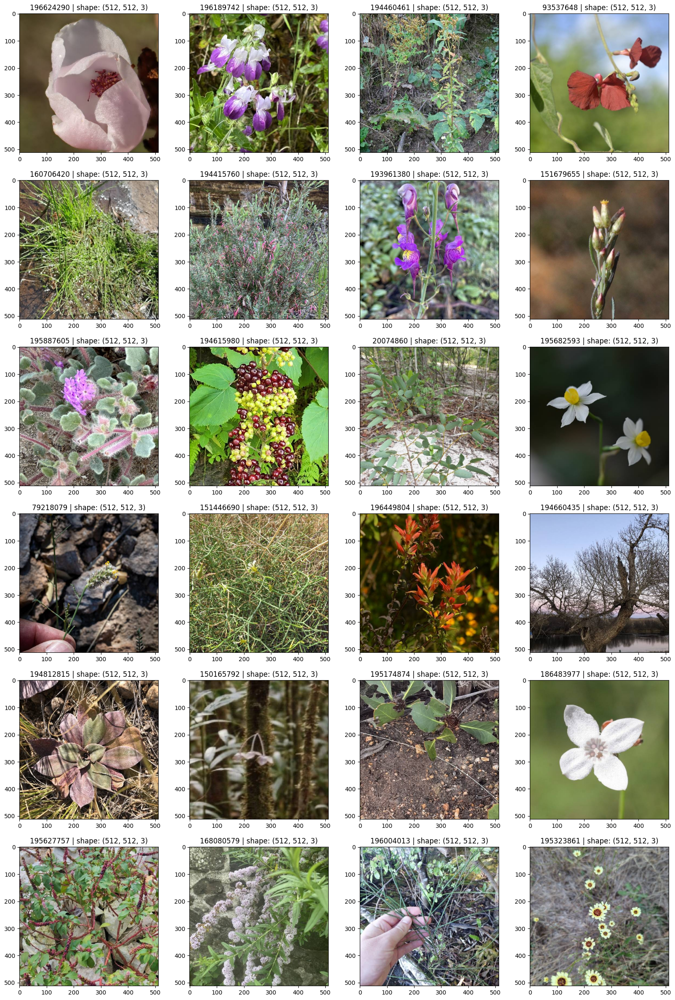

In [25]:
def plot_example(nrows=6, ncols=4):
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*5, nrows*5))
    for r in range(nrows):
        for c in range(ncols):
            idx = (r*ncols) + c
            img = imageio.imread(train['jpeg_bytes'][idx])
            image_id = train['id'][idx]
            axes[r, c].imshow(img)
            axes[r, c].set_title(f"{image_id} | shape: {img.shape}")
    plt.show()

plot_example()

In [26]:
target_name_meta = pd.read_csv('data/planttraits2024_1/target_name_meta.tsv', delimiter='\t')
target_name_meta['trait_ID'] = target_name_meta['trait_ID'] + '_mean'
target_name_meta = target_name_meta.set_index('trait_ID').squeeze().to_dict()

display(pd.Series(target_name_meta).to_frame())

,0
X4_mean,Stem specific density (SSD) or wood density (s...
X11_mean,Leaf area per leaf dry mass (specific leaf are...
X18_mean,Plant height
X26_mean,Seed dry mass
X50_mean,Leaf nitrogen (N) content per leaf area
X3112_mean,"Leaf area (in case of compound leaves: leaf, u..."


In [27]:
percentiles = [
    0.001, 0.01, 0.05, 0.10, 0.25, 
    0.50,
    0.75, 0.90, 0.95, 0.99, 0.999
]
labels_describe_df = pd.DataFrame()
for target in CONFIG.TARGET_COLUMNS:
    labels_describe_df = pd.concat((
        labels_describe_df, train[target].describe(percentiles=percentiles).round(3)
    ), axis=1)

labels_describe_df = labels_describe_df.T

labels_describe_df.insert(4, 'v_min', CONFIG.V_MIN)
labels_describe_df.insert(16, 'v_max', CONFIG.V_MAX)

display(labels_describe_df)

,count,mean,std,min,v_min,0.1%,1%,5%,10%,25%,50%,75%,90%,95%,99%,99.9%,v_max,max
X4_mean,51393.0,0.522,1.760000e-01,-2.431,-0.416011,-0.416,0.227,0.304,0.339,0.411,0.508,0.622,0.724,0.796,0.918,1.447,1.446793,4.475000e+00
X11_mean,51393.0,141.735,1.328176e+04,0.000,0.516698,0.517,3.078,4.916,6.455,10.645,15.126,19.691,25.311,30.983,51.257,618.885,618.884844,1.504254e+06
X18_mean,51393.0,15975.172,2.078502e+06,0.000,0.005098,0.005,0.041,0.101,0.162,0.309,0.717,3.584,11.323,17.018,28.565,199.613,199.612717,2.720494e+08
X50_mean,51393.0,14.462,1.409496e+03,0.000,0.056425,0.056,0.486,0.774,0.923,1.173,1.480,1.926,2.494,3.036,4.480,39.876,39.876007,1.597599e+05
X26_mean,51393.0,3124.661,2.172520e+05,0.000,0.001079,0.001,0.011,0.047,0.119,0.559,2.511,14.955,79.011,218.550,1395.933,9667.620,9667.619594,3.106555e+07
X3112_mean,51393.0,428975.777,9.510196e+07,0.000,1.132863,1.133,11.180,42.309,89.349,255.021,726.080,2152.292,4844.885,8200.883,24695.882,453450.026,453450.025900,2.155911e+10


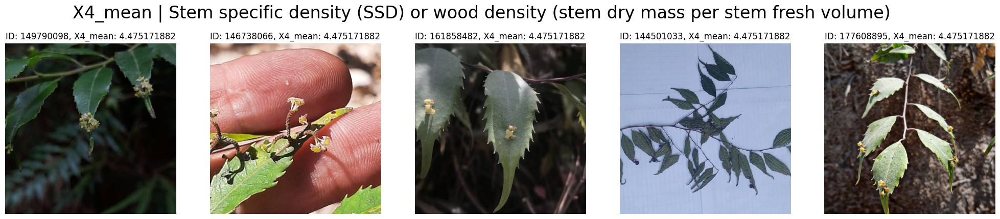

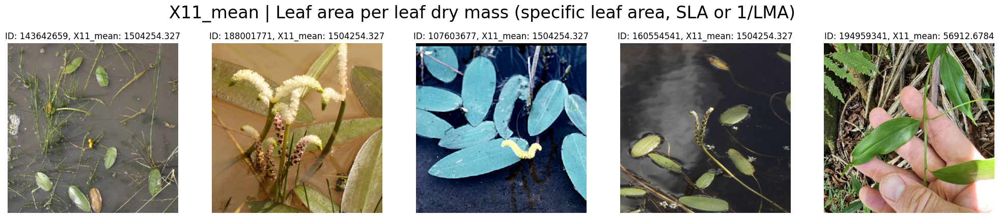

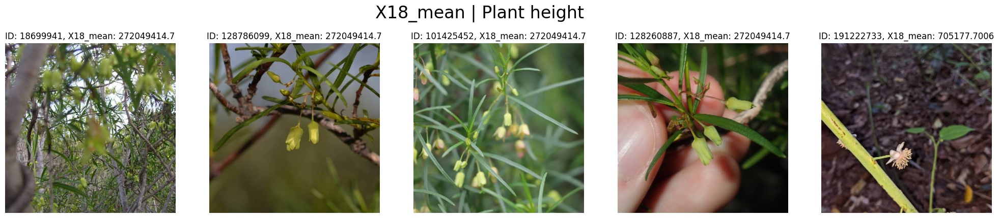

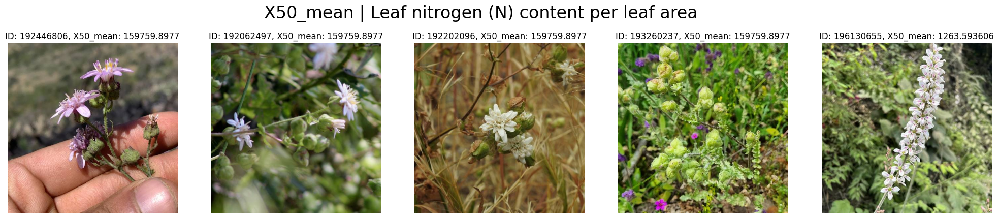

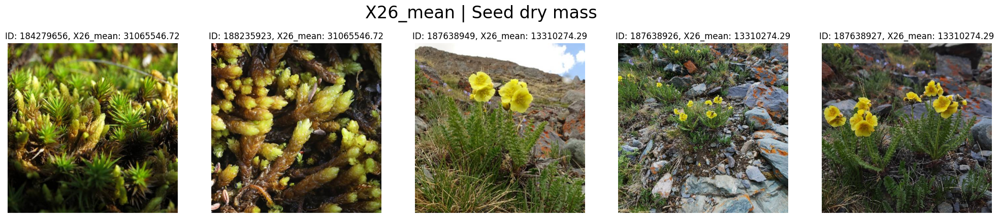

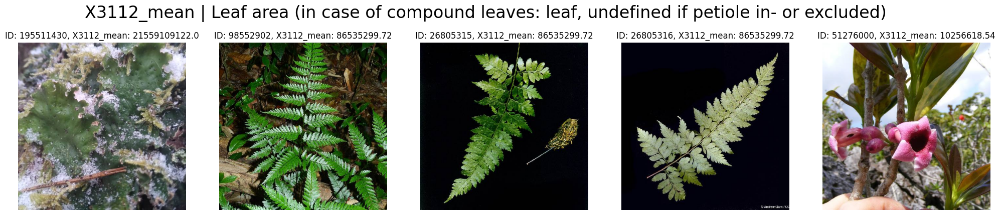

In [29]:
def plot_samples(target, df, n):
    rows = train0.sort_values(target, ascending=False).head(n)
    fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
    plt.suptitle(f"{target} | {target_name_meta[target]}", size=24)
    for ax, (row_idx, row) in zip(axes, rows.iterrows()):
        ax.set_title(f"ID: {row.id}, {target}: {row[target]}", size=12)
        ax.imshow(imageio.imread(row['jpeg_bytes']))
        ax.axis('off')
    plt.show()

for target in CONFIG.TARGET_COLUMNS:
    plot_samples(target, train0, 5)

In [30]:
# Mask to exclude values outside of 0.1% - 99.9% range
def get_mask(df):
    lower = []
    higher = []
    mask = np.empty(shape=df[CONFIG.TARGET_COLUMNS].shape, dtype=bool)
    # Fill mask based on minimum/maximum values of sample submission
    for idx, (t, v_min, v_max) in enumerate(zip(CONFIG.TARGET_COLUMNS, CONFIG.V_MIN, CONFIG.V_MAX)):
        labels = df[t].values
        mask[:,idx] = ((labels > v_min) & (labels < v_max))
    return mask.min(axis=1)

# Masks
CONFIG.MASK_TRAIN = get_mask(train)
CONFIG.MASK_VAL = get_mask(val)
# Masked DataFrames
train_mask = train[CONFIG.MASK_TRAIN].reset_index(drop=True)
val_mask = val[CONFIG.MASK_VAL].reset_index(drop=True)
# Add Number Of Steps
CONFIG.N_TRAIN_SAMPLES = len(train_mask)
CONFIG.N_VAL_SAMPLES = len(val_mask)
CONFIG.N_STEPS_PER_EPOCH = (CONFIG.N_TRAIN_SAMPLES // CONFIG.BATCH_SIZE)
CONFIG.N_VAL_STEPS_PER_EPOCH = math.ceil(CONFIG.N_VAL_SAMPLES / CONFIG.BATCH_SIZE_VAL)
CONFIG.N_STEPS = CONFIG.N_STEPS_PER_EPOCH * CONFIG.N_EPOCHS + 1

for m, subset in zip([CONFIG.MASK_TRAIN, CONFIG.MASK_VAL], ['train', 'val']):
    print(f'===== {subset} shape: {m.shape} =====')
    print(f'{subset} \t| # Masked Samples: {(1-m.mean())*CONFIG.N_TRAIN_SAMPLES:.0f}')
    print(f'{subset} \t| % Masked Samples: {100-m.mean()*100:.3f}%')

===== train shape: (51393,) =====
train 	| # Masked Samples: 333
train 	| % Masked Samples: 0.652%
===== val shape: (4096,) =====
val 	| # Masked Samples: 262
val 	| % Masked Samples: 0.513%


In [31]:
# Log Scale Features
LOG_FEATURES = ['X11_mean', 'X18_mean', 'X50_mean', 'X26_mean', 'X3112_mean']

In [32]:
# Fill labels using normalization tool
def fill_y(y, df, normalize=False):
    for target_idx, target in enumerate(CONFIG.TARGET_COLUMNS):
        v = df[target]
        if normalize:
            # Log10 Transform
            if target in LOG_FEATURES:
                v = np.log10(v)
            # Shift To Have Zero Median
            Y_SHIFT[target_idx] = np.mean(v)
            v = v - np.median(v)
            # Uniform Variance
            Y_STD[target_idx] = np.std(v)
            v = v / np.std(v)
        # Assign to y_train
        y[:,target_idx] = v

# Feature Scaler
Y_SHIFT = np.zeros(CONFIG.N_TARGETS)
Y_STD = np.zeros(CONFIG.N_TARGETS)
# Masked Labels
y_train_mask_raw = np.zeros_like(train_mask[CONFIG.TARGET_COLUMNS], dtype=np.float32)
y_train_mask = np.zeros_like(train_mask[CONFIG.TARGET_COLUMNS], dtype=np.float32)
y_val_mask = np.zeros_like(val_mask[CONFIG.TARGET_COLUMNS], dtype=np.float32)
# Fill Target Arrays
fill_y(y_train_mask_raw, train_mask, normalize=False)
fill_y(y_train_mask, train_mask, normalize=True)
fill_y(y_val_mask, val_mask, normalize=True)
# Values
display(pd.DataFrame({
    'y_shift': Y_SHIFT,
    'y_std': Y_STD
}, index=CONFIG.TARGET_COLUMNS))

,y_shift,y_std
X4_mean,0.525256,0.151960
X11_mean,1.142098,0.237343
X18_mean,0.008041,0.685711
X50_mean,0.177678,0.180489
X26_mean,0.459768,1.085055
X3112_mean,2.851682,0.674478


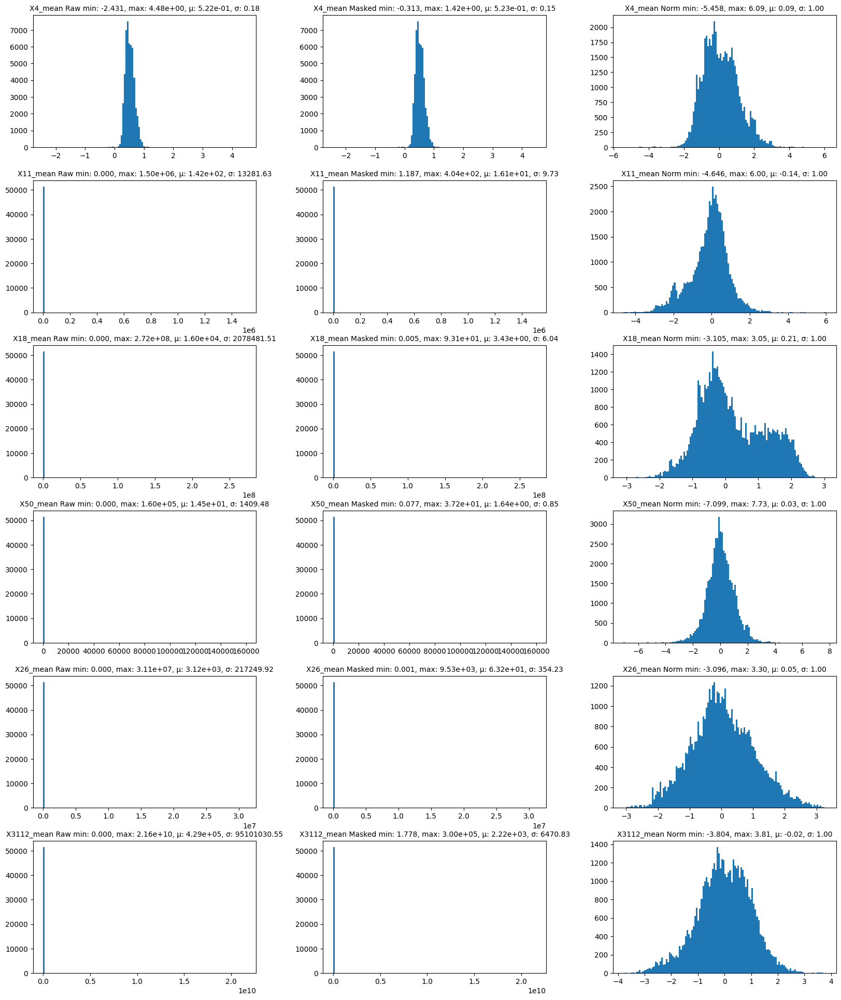

In [34]:
def plot_target_distribution():
    fig, axes = plt.subplots(CONFIG.N_TARGETS, 3, figsize=(20, CONFIG.N_TARGETS*4))
    v_raw = train[CONFIG.TARGET_COLUMNS].values
    for (ax_raw, ax_mask, ax_norm), target, v_r, v_n in zip(axes, CONFIG.TARGET_COLUMNS, v_raw.T, y_train_mask.T):
        # Raw
        ax_raw.hist(v_r, bins=128)
        ax_raw.set_title(f'{target} Raw min: {v_r.min():.3f}, max: {v_r.max():.2e}, µ: {v_r.mean():.2e}, σ: {v_r.std():.2f}', size=10)
        # Masked
        v_m = v_r[CONFIG.MASK_TRAIN]
        ax_mask.hist(v_r, bins=128)
        ax_mask.set_title(f'{target} Masked min: {v_m.min():.3f}, max: {v_m.max():.2e}, µ: {v_m.mean():.2e}, σ: {v_m.std():.2f}', size=10)
        # Normalized
        ax_norm.hist(v_n, bins=128)
        ax_norm.set_title(f'{target} Norm min: {v_n.min():.3f}, max: {v_n.max():.2f}, µ: {v_n.mean():.2f}, σ: {v_n.std():.2f}', size=10)
    plt.subplots_adjust(hspace=0.25, wspace=0.30)
    plt.show()
    
plot_target_distribution()

In [35]:
# Standard Scaler for Features
FEATURE_SCALER = StandardScaler()

# Fit and transform on training features
train_features_mask = FEATURE_SCALER.fit_transform(train_mask[FEATURE_COLUMNS].values.astype(np.float32))
# Transform val/test features using scaler fitted on train data
val_features_mask = FEATURE_SCALER.transform(val_mask[FEATURE_COLUMNS].values.astype(np.float32))
test_features = FEATURE_SCALER.transform(test[FEATURE_COLUMNS].values.astype(np.float32))
# Convert Features to Torch Tensors
train_features_mask = torch.tensor(train_features_mask)
val_features_mask = torch.tensor(val_features_mask)
test_features = torch.tensor(test_features)

In [36]:
MEAN = np.array([0.485, 0.456, 0.406])
STD = np.array([0.229, 0.224, 0.225])
# Training Augmentations
TRAIN_TRANSFORMS = A.Compose([
        A.RandomSizedCrop(
            [int(0.85*CONFIG.IMAGE_SIZE0), CONFIG.IMAGE_SIZE0],
            CONFIG.IMAGE_SIZE, CONFIG.IMAGE_SIZE, w2h_ratio=1.0, p=1.0
        ),
        A.HorizontalFlip(p=0.50),
        A.RandomBrightnessContrast(brightness_limit=0.10, contrast_limit=0.10, p=0.50),
        A.ImageCompression(quality_lower=75, quality_upper=100, p=0.5),
        ToTensorV2(),
    ])
# Test Augmentations
VAL_TEST_TRANSFORMS = A.Compose([
        A.Resize(CONFIG.IMAGE_SIZE,CONFIG.IMAGE_SIZE),
        ToTensorV2(),
    ])

In [37]:
class MyDataset(Dataset):
    def __init__(self, X_jpeg_bytes, y, features, transforms=None):
        self.X_jpeg_bytes = X_jpeg_bytes
        self.y = y
        self.features = features
        self.transforms = transforms

    def __len__(self):
        return len(self.X_jpeg_bytes)

    def __getitem__(self, index):
        X_sample = {
            'image': self.transforms(
                    image=imageio.imread(self.X_jpeg_bytes[index]),
                )['image'],
            'feature': self.features[index],
        }
        y_sample = self.y[index]
            
        return X_sample, y_sample

In [3]:
import timm
timm.list_models()

['bat_resnext26ts',
 'beit_base_patch16_224',
 'beit_base_patch16_384',
 'beit_large_patch16_224',
 'beit_large_patch16_384',
 'beit_large_patch16_512',
 'beitv2_base_patch16_224',
 'beitv2_large_patch16_224',
 'botnet26t_256',
 'botnet50ts_256',
 'caformer_b36',
 'caformer_m36',
 'caformer_s18',
 'caformer_s36',
 'cait_m36_384',
 'cait_m48_448',
 'cait_s24_224',
 'cait_s24_384',
 'cait_s36_384',
 'cait_xs24_384',
 'cait_xxs24_224',
 'cait_xxs24_384',
 'cait_xxs36_224',
 'cait_xxs36_384',
 'coat_lite_medium',
 'coat_lite_medium_384',
 'coat_lite_mini',
 'coat_lite_small',
 'coat_lite_tiny',
 'coat_mini',
 'coat_small',
 'coat_tiny',
 'coatnet_0_224',
 'coatnet_0_rw_224',
 'coatnet_1_224',
 'coatnet_1_rw_224',
 'coatnet_2_224',
 'coatnet_2_rw_224',
 'coatnet_3_224',
 'coatnet_3_rw_224',
 'coatnet_4_224',
 'coatnet_5_224',
 'coatnet_bn_0_rw_224',
 'coatnet_nano_cc_224',
 'coatnet_nano_rw_224',
 'coatnet_pico_rw_224',
 'coatnet_rmlp_0_rw_224',
 'coatnet_rmlp_1_rw2_224',
 'coatnet_rmlp_1_r

In [3]:
import transformers

print(transformers.__version__)

4.38.1


In [2]:
import transformers
print(transformers.__version__)

4.38.1
